In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skin-cancer-datasetv3/README.dataset.txt
/kaggle/input/skin-cancer-datasetv3/README.roboflow.txt
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0029387_jpg.rf.c790337dff5b55777a7ceedb7ab82d21.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0029842_jpg.rf.0b11155f89407f7c49521a795bfab6b1.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0029273_jpg.rf.e1a7e845b0152533c6a794fe9b1feaba.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0034122_jpg.rf.a11aba7c75a49ffc1813fe0ab7376eb5.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0033031_jpg.rf.d2d74399d92b1b2bcecd237d76f3dce7.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0026548_jpg.rf.44611a49337de8144eceeeae2d58b186.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0032932_jpg.rf.9b349b5a3012eca59c2b3eb7fb24992c.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0029646_jpg.rf.9ae62ae010959e6206f2ab98590f6a4b.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0027131_jpg.rf.463833b18582a3472ce5c6a5c3e5e049.jp

## 🧩 COCO → YOLO Segmentation Conversion

This section converts the **COCO-format segmentation dataset** into the **YOLO segmentation format**, preparing it for YOLOv8 or YOLOv11 or YoLO 12 segmentation model training using the **Ultralytics** framework.

---

#### ⚙️ Step 1: Library Installation
The following Python packages are installed:
- **`pycocotools`** → to handle COCO JSON annotations  
- **`tqdm`** → for progress visualization  
- **`ultralytics`** → YOLO training and evaluation tools  

---

#### 🧠 Step 2: Conversion Process
A custom function performs the following operations:
1. **Loads COCO annotations** (`_annotations.coco.json`) for each dataset split (`train`, `valid`, `test`).  
2. **Creates YOLO-style folders** — `images/` and `labels/`.  
3. **Converts segmentation polygons** into **YOLO-normalized coordinates** (values between 0 and 1).  
4. **Generates YOLO label files** (`.txt`) in the format:
5. **Copies images** into the respective YOLO `images/` directory.  
6. **Processes all splits automatically** to ensure consistency.  

---

#### 🔁 Step 3: Split Processing
All three dataset splits — **train**, **valid**, and **test** — are converted sequentially.  
The final YOLO-formatted dataset is saved inside:
/kaggle/working/dataset/
│
├── train/
│ ├── images/
│ └── labels/
│
├── valid/
│ ├── images/
│ └── labels/
│
└── test/
├── images/
└── labels/

---

Each `.txt` file corresponds to its image and contains polygon coordinates describing the segmentation mask in YOLO format.  
All coordinates are **normalized** relative to image width and height.

In [2]:
!pip install pycocotools tqdm
!pip install ultralytics pycocotools tqdm --quiet

import os, json, shutil
from tqdm import tqdm

def coco_to_yolo_segmentation(coco_json, output_dir):
    with open(coco_json, 'r') as f:
        data = json.load(f)

    # Prepare mapping
    id_to_filename = {img['id']: img['file_name'] for img in data['images']}
    os.makedirs(os.path.join(output_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'labels'), exist_ok=True)

    # Copy images and make YOLO labels
    for ann in tqdm(data['annotations'], desc=f"Converting {coco_json}"):
        image_id = ann['image_id']
        category_id = ann['category_id'] - 1  # YOLO expects 0-based class IDs
        segmentation = ann['segmentation'][0]

        # Normalize segmentation points
        image_info = next((img for img in data['images'] if img['id'] == image_id), None)
        w, h = image_info['width'], image_info['height']
        seg_norm = [f"{x/w:.6f} {y/h:.6f}" for x, y in zip(segmentation[::2], segmentation[1::2])]

        # Write label file
        label_path = os.path.join(output_dir, 'labels', id_to_filename[image_id].replace('.jpg', '.txt'))
        with open(label_path, 'w') as f:
            f.write(f"{category_id} " + " ".join(seg_norm) + "\n")

        # Move image to images/ folder
        src_img = os.path.join(os.path.dirname(coco_json), id_to_filename[image_id])
        dst_img = os.path.join(output_dir, 'images', id_to_filename[image_id])
        if os.path.exists(src_img):
            shutil.copy(src_img, dst_img)

# === Convert all splits ===
base = "/kaggle/input/skin-cancer-datasetv3"
for split in ['train', 'valid', 'test']:
    coco_file = os.path.join(base, split, "_annotations.coco.json")
    out_dir = os.path.join("/kaggle/working/dataset", split)
    coco_to_yolo_segmentation(coco_file, out_dir)

print("✅ Conversion complete! Dataset now ready in /kaggle/working/dataset/")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 97.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2

Converting /kaggle/input/skin-cancer-datasetv3/train/_annotations.coco.json: 100%|██████████| 11903/11903 [01:16<00:00, 154.90it/s]
Converting /kaggle/input/skin-cancer-datasetv3/valid/_annotations.coco.json: 100%|██████████| 2000/2000 [00:12<00:00, 164.93it/s]
Converting /kaggle/input/skin-cancer-datasetv3/test/_annotations.coco.json: 100%|██████████| 1000/1000 [00:05<00:00, 171.52it/s]

✅ Conversion complete! Dataset now ready in /kaggle/working/dataset/


## 🖼️ 1. Sample Image Selection
- Loaded three random images from `/kaggle/working/dataset/train/images/`.
- Displayed them using `matplotlib`.

---

### ⚙️ 2. Intensity Transformation Techniques
Applied the following four transformations on each image:

| Transformation | Description |
|----------------|--------------|
| **Log Transformation** | Expands darker pixels and compresses bright areas using logarithmic scaling. |
| **Gamma Correction (Power-law)** | Adjusts image brightness using γ = 1.5. Values >1 darken the image. |
| **Contrast Stretching** | Linearly maps pixel values to the full range (0–255) to enhance contrast. |
| **Histogram Equalization (CLAHE)** | Improves local contrast using the LAB color model and adaptive histogram equalization. |

Each transformed image was displayed beside the original for comparison.

---

### 🔍 3. Filtering Techniques
Applied three spatial filters and one edge-based filter to smooth or enhance details:

| Filter Type | Method | Effect |
|--------------|---------|--------|
| **Mean Filter** | `cv2.blur()` | Reduces noise by averaging neighboring pixels. |
| **Gaussian Blur** | `cv2.GaussianBlur()` | Smoothens image with a weighted average, preserving edges better. |
| **Median Filter** | `cv2.medianBlur()` | Removes salt-and-pepper noise effectively. |
| **Sobel Edge Filter** | `cv2.Sobel()` | Enhances edges using gradient magnitude of intensity changes. |

---

### 📊 4. Result Visualization
Each transformation and filter was applied and displayed side-by-side:
- **Left:** Original image  
- **Right:** Transformed or filtered result  

This allows visual comparison of the impact of each operation on image brightness, contrast, and detail sharpness.

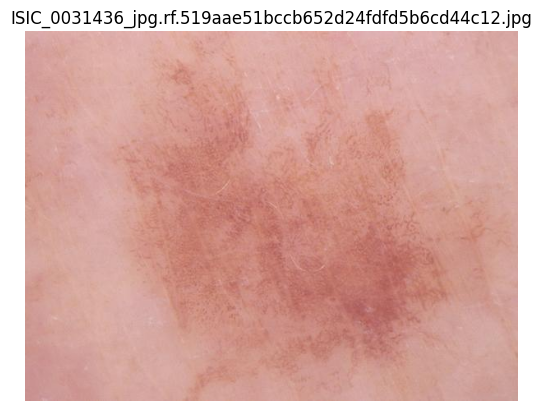

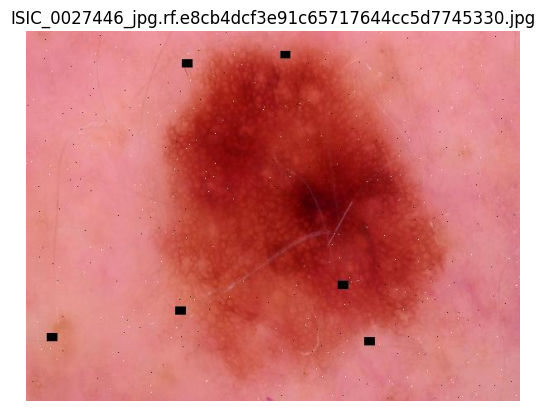

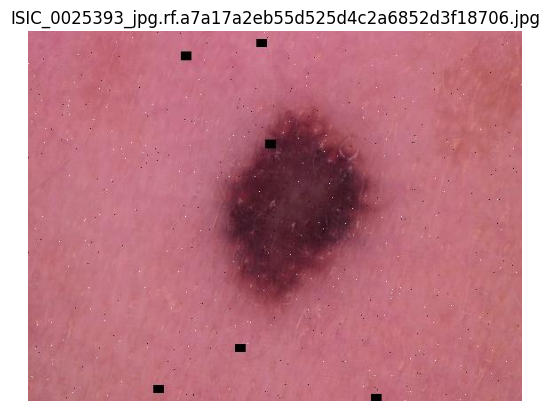

In [3]:
import os
import cv2
import random
import matplotlib.pyplot as plt

train_path = "/kaggle/working/dataset/train/images"  # change if needed

# Get all image filenames
image_files = [f for f in os.listdir(train_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Pick 3 random images
sample_files = random.sample(image_files, 3)

# Load and convert to RGB
images = [cv2.cvtColor(cv2.imread(os.path.join(train_path, img)), cv2.COLOR_BGR2RGB) for img in sample_files]

# Display the images
for i, img in enumerate(images):
    plt.imshow(img)
    plt.title(sample_files[i])
    plt.axis('off')
    plt.show()

In [4]:
# Log Transformation
def log_transform(img):
    c = 255 / np.log(1 + np.max(img))
    log_img = c * np.log(1 + img.astype(np.float32))
    return np.uint8(log_img)

In [5]:
# Gamma Correction
def gamma_correction(img, gamma=1.5):
    img_float = img / 255.0
    gamma_img = np.power(img_float, gamma) * 255
    return np.uint8(gamma_img)

In [6]:
# Contrast Stretching
def contrast_stretch(img):
    in_min = np.min(img)
    in_max = np.max(img)
    out_img = (img - in_min) * (255 / (in_max - in_min))
    return np.uint8(out_img)

In [7]:
# CLAHE (Histogram Equalization)
def clahe_rgb(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    merged = cv2.merge([cl, a, b])
    return cv2.cvtColor(merged, cv2.COLOR_LAB2RGB)

--- Image: ISIC_0027785_jpg.rf.61d852ed6dadc11beacb34415c0c5371.jpg ---


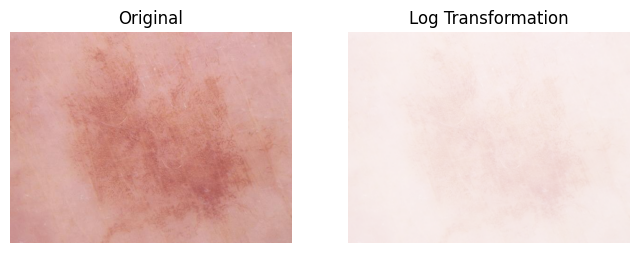

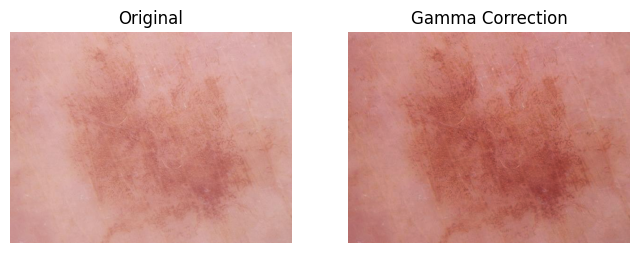

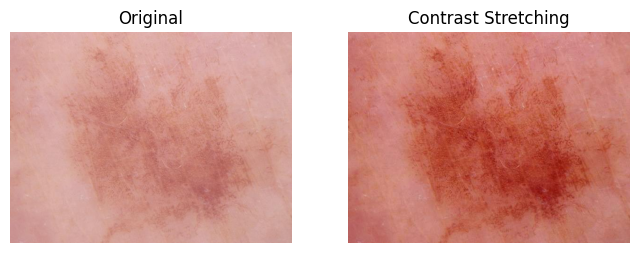

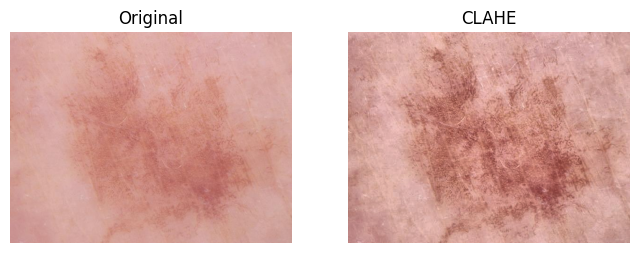

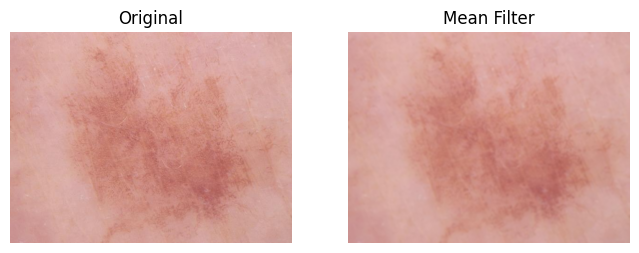

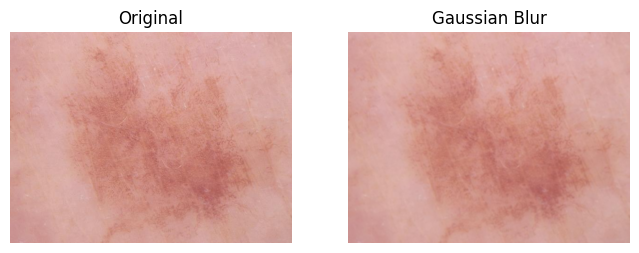

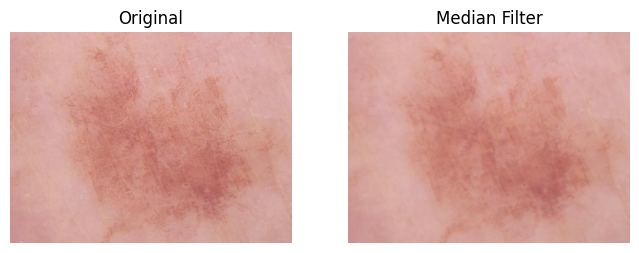

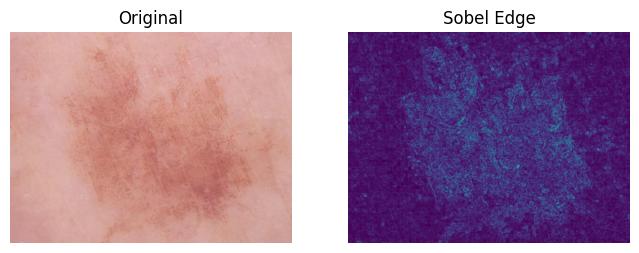

--- Image: ISIC_0032273_jpg.rf.51643544f6b112a4ae22b40d6bd61991.jpg ---


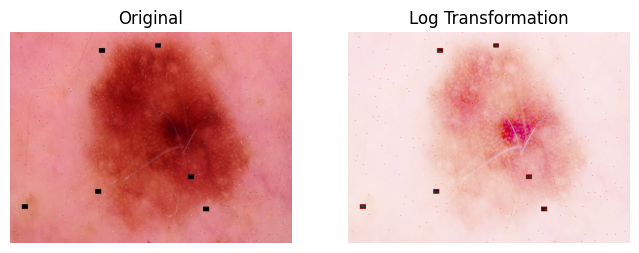

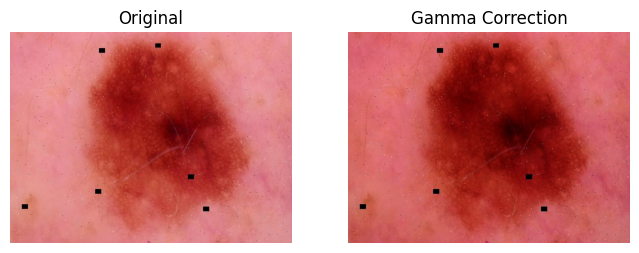

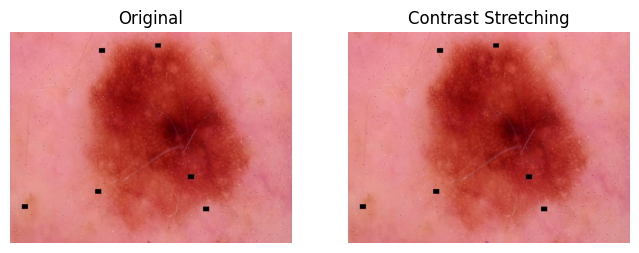

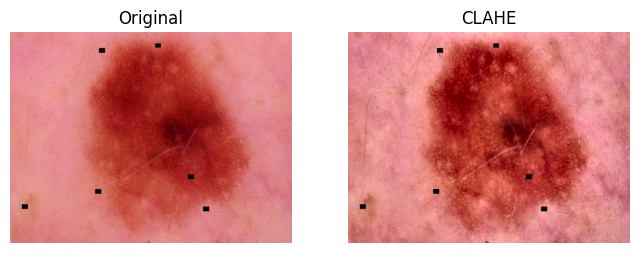

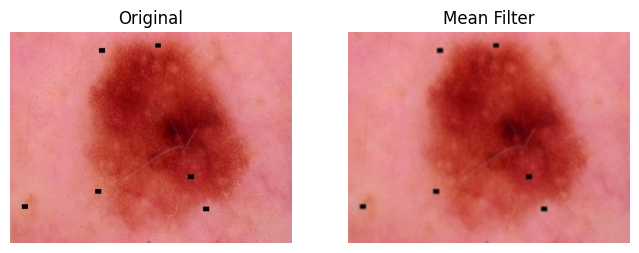

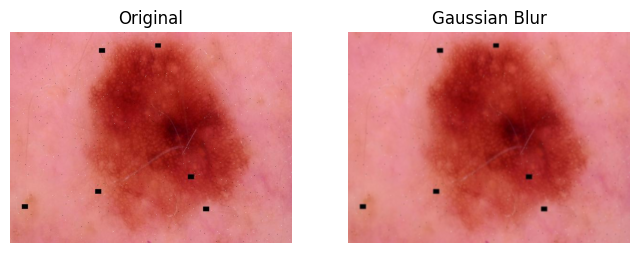

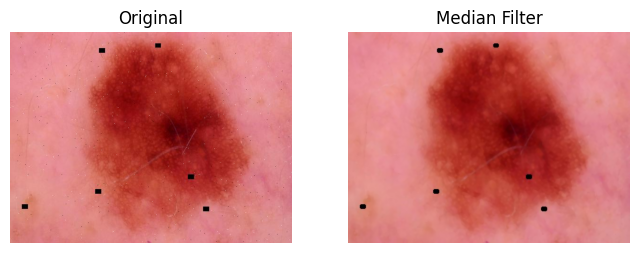

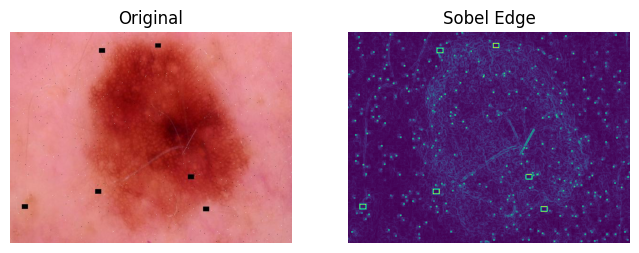

--- Image: ISIC_0025369_jpg.rf.5f379256f19e84d38b018278d9fd5e50.jpg ---


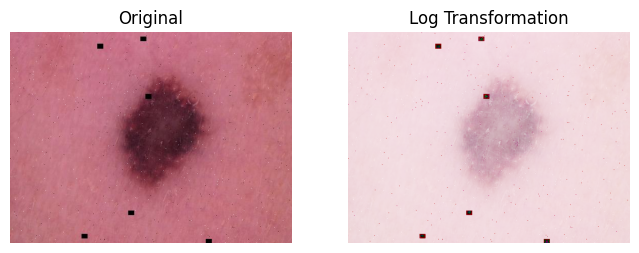

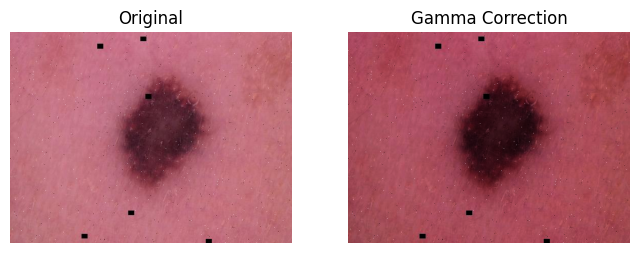

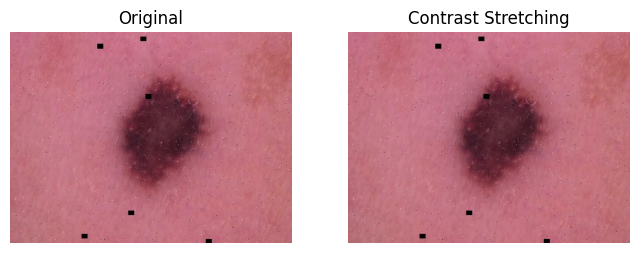

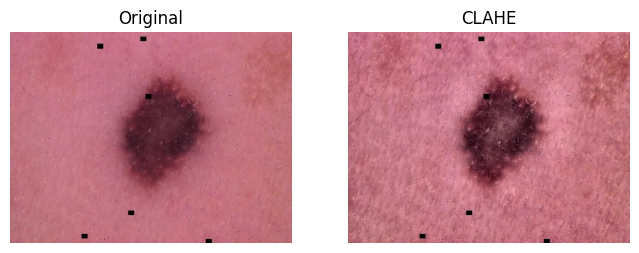

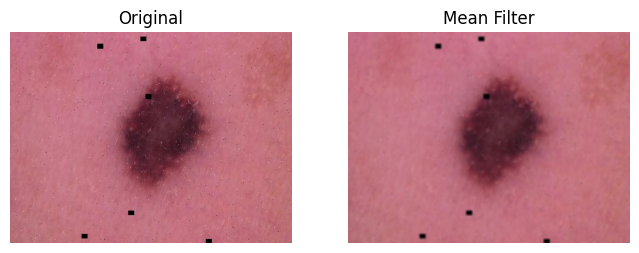

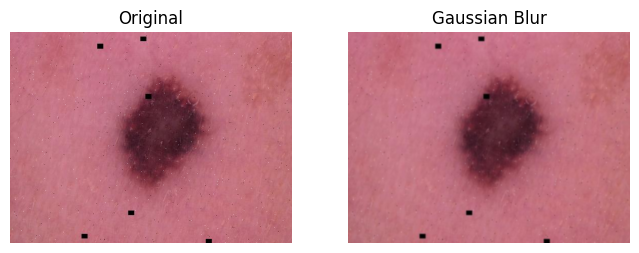

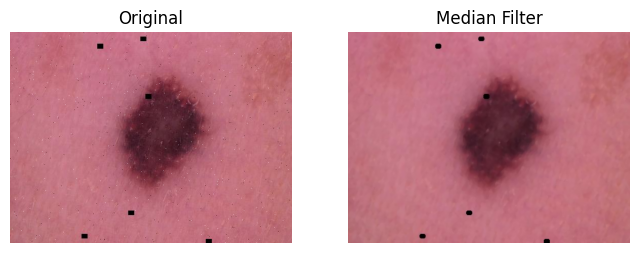

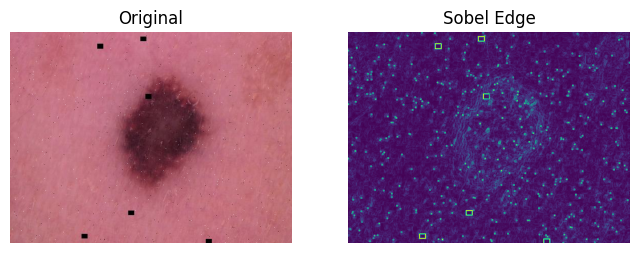

In [8]:
# --- 3. Define Filtering Operations ---
def apply_filters(img):
    filters = {}
    filters['Mean Filter'] = cv2.blur(img, (5,5))
    filters['Gaussian Blur'] = cv2.GaussianBlur(img, (5,5), 0)
    filters['Median Filter'] = cv2.medianBlur(img, 5)
    # Sobel Edge Enhancement
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = cv2.magnitude(sobelx, sobely)
    filters['Sobel Edge'] = np.uint8(np.clip(sobel_combined, 0, 255))
    return filters

# --- 4. Helper function to display before-and-after ---
def show_results(original, transformed, title):
    plt.figure(figsize=(8,5))
    plt.subplot(1,2,1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis('off')
    
    plt.subplot(1,2,2)
    plt.imshow(transformed)
    plt.title(title)
    plt.axis('off')
    plt.show()
# --- 5. Apply transformations and display results ---
for i, img in enumerate(images):
    print(f"--- Image: {image_files[i]} ---")
    
    # Intensity Transformations
    log_img = log_transform(img)
    gamma_img = gamma_correction(img, gamma=1.5)
    contrast_img = contrast_stretch(img)
    clahe_img = clahe_rgb(img)
    
    show_results(img, log_img, "Log Transformation")
    show_results(img, gamma_img, "Gamma Correction")
    show_results(img, contrast_img, "Contrast Stretching")
    show_results(img, clahe_img, "CLAHE")
    
    # Filtering
    filters = apply_filters(img)
    for f_name, f_img in filters.items():
        show_results(img, f_img, f_name)

## 🗂️ Dataset Configuration (dataset.yaml)

Before training the YOLO model, a configuration file named **`dataset.yaml`** was created to define dataset paths and class labels.

In [9]:
%%writefile dataset.yaml


train: /kaggle/working/dataset/train/images
val: /kaggle/working/dataset/valid/images
test: /kaggle/working/dataset/test/images
nc: 2
names: ['affected','non']

Writing dataset.yaml


In [10]:
!cat dataset.yaml



train: /kaggle/working/dataset/train/images
val: /kaggle/working/dataset/valid/images
test: /kaggle/working/dataset/test/images
nc: 2
names: ['affected','non']


## 📂 Dataset Configuration Verification Script

This script is used to **load, inspect, and validate a YOLO-style dataset configuration file (`dataset.yaml`)**.  
It ensures that each dataset split (train, validation, and test) is properly defined and contains image files.

---

### 📌 Purpose
- Load and display the contents of `dataset.yaml`
- Verify whether dataset paths are correctly defined
- Count the number of image files in each split directory

---

### 🧩 Required Libraries
```python
import os
import glob
import yaml


In [11]:
import os
import glob
import yaml

DATA_YAML = "/kaggle/working/dataset.yaml"

# Show the YAML contents
with open(DATA_YAML) as f:
    cfg = yaml.safe_load(f)
print(cfg)

# Count images in each dataset split
for split in ["train", "valid", "test"]:
    if split in cfg and cfg[split]:
        img_dir = cfg[split]
        n_files = len(glob.glob(os.path.join(img_dir, "*.*")))
        print(f"{split:<5} -> {img_dir} : {n_files} files")
    else:
        print(f"{split:<5} -> Not defined or empty in YAML")

{'train': '/kaggle/working/dataset/train/images', 'val': '/kaggle/working/dataset/valid/images', 'test': '/kaggle/working/dataset/test/images', 'nc': 2, 'names': ['affected', 'non']}
train -> /kaggle/working/dataset/train/images : 11903 files
valid -> Not defined or empty in YAML
test  -> /kaggle/working/dataset/test/images : 1000 files


In [12]:
# Install ultralytics without installing any dependencies
!pip -q install --upgrade ultralytics --no-deps


In [13]:
from ultralytics import YOLO
import os, glob, random, shutil, cv2
import numpy as np
import torch
import albumentations as A
from tqdm import tqdm

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [14]:
import os

dataset = "/kaggle/input/skin-cancer-datasetv3"
print(os.listdir(dataset))


['README.dataset.txt', 'README.roboflow.txt', 'valid', 'test', 'train']


## 🧠 YOLO Instance Segmentation Visualization (2×2 Grid)

This script visualizes **YOLO instance segmentation annotations** by overlaying **polygon masks or bounding boxes** on randomly selected training images and displaying them in a **2×2 grid**.

---

## 📌 Purpose
- Visually verify YOLO segmentation labels  
- Support both polygon masks and bounding box annotations  
- Randomly sample training images for qualitative inspection  

---

## 🧩 Required Libraries
```python
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt


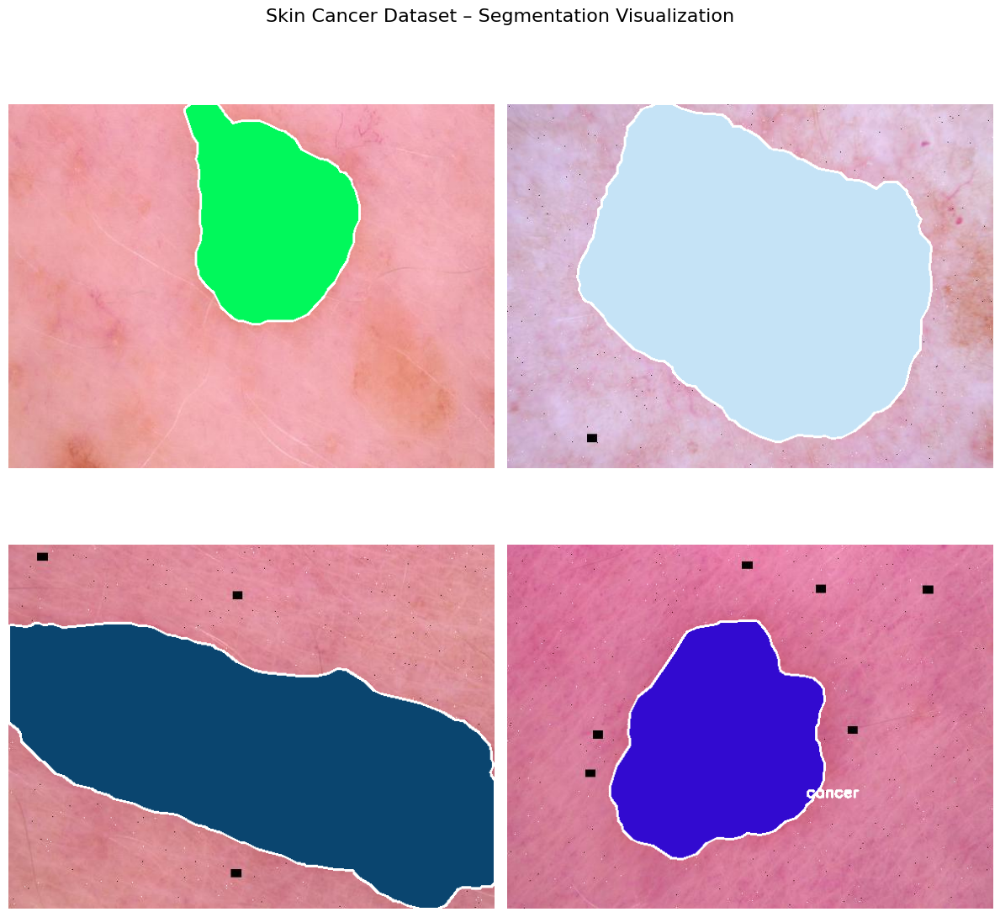

In [15]:
import os, random, cv2
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# YOLO Instance Segmentation Visualization (2x2 Grid)
# ============================================================

image_dir = "/kaggle/working/dataset/train/images"
label_dir = "/kaggle/working/dataset/train/labels"

# Collect all images (any extension)
all_imgs = [f for f in os.listdir(image_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]

if len(all_imgs) == 0:
    raise ValueError("No image files found in images/ folder.")

# Pick up to 4 images for 2x2 grid
image_files = random.sample(all_imgs, min(4, len(all_imgs)))


def visualize_image(img_path, label_path, class_name="cancer"):
    """Draw polygons or bounding boxes from YOLO label."""
    img = cv2.imread(img_path)
    if img is None:
        return np.zeros((100, 100, 3), dtype=np.uint8)

    h, w = img.shape[:2]
    overlay = img.copy()

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            vals = list(map(float, line.strip().split()))
            cls_id = int(vals[0])
            coords = vals[1:]

            # Polygon segmentation
            if len(coords) > 4:
                pts = np.array(coords).reshape(-1, 2)
                pts[:, 0] *= w
                pts[:, 1] *= h
                pts = pts.astype(np.int32)
                color = tuple(np.random.randint(0, 255, 3).tolist())

                cv2.fillPoly(overlay, [pts], color)
                cv2.polylines(overlay, [pts], True, (255, 255, 255), 2)
                cv2.putText(overlay, class_name, (pts[0][0], pts[0][1] - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

            else:
                # Bounding box fallback
                xc, yc, bw, bh = coords
                x1 = int((xc - bw/2) * w)
                y1 = int((yc - bh/2) * h)
                x2 = int((xc + bw/2) * w)
                y2 = int((yc + bh/2) * h)

                color = tuple(np.random.randint(0, 255, 3).tolist())
                cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 2)
                cv2.putText(overlay, class_name, (x1, y1 - 5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    return overlay


# Plot 2×2 grid
plt.figure(figsize=(12, 12))

for idx, fname in enumerate(image_files):
    img_path = os.path.join(image_dir, fname)

    # Create label filename for any extension
    label_name = os.path.splitext(fname)[0] + ".txt"
    label_path = os.path.join(label_dir, label_name)

    vis = visualize_image(img_path, label_path)

    plt.subplot(2, 2, idx + 1)
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.suptitle("Skin Cancer Dataset – Segmentation Visualization", fontsize=16)
plt.tight_layout()
plt.show()


## 🗂️ YOLO Dataset Merge and Re-Splitting Script

This script **merges images from multiple existing dataset splits** and **recreates a clean YOLO-compatible train/val/test split** with user-defined ratios.  
It also **copies corresponding label files** and generates a new `dataset.yaml`.

---

## 📌 Objectives
- Merge images from multiple source directories  
- Randomly reshuffle and re-split the dataset  
- Preserve YOLO image–label pairing  
- Generate a fresh YOLO `dataset.yaml`  

---

## ⚙️ Configuration

```python
SOURCE_DIRS = [
    "/kaggle/working/dataset/train/images",
    "/kaggle/working/dataset/test/images",
    "/kaggle/working/dataset/valid/images"
]

BASE_OUTPUT_DIR = "/kaggle/working/new_dataset"

SPLIT_RATIO = {"train": 0.8, "val": 0.1, "test": 0.1}


In [16]:
import os
import glob
import shutil
import random
import yaml
from pathlib import Path

# ================= CONFIGURATION =================
# 1. Where is your data CURRENTLY? (Add all folders containing images)
#    Example: If you have separate folders for old train/test, list them all.
SOURCE_DIRS = [
    "/kaggle/working/dataset/train/images",
    "/kaggle/working/dataset/test/images",
    "/kaggle/working/dataset/valid/images"
]

# 2. Where do you want the NEW split to go?
BASE_OUTPUT_DIR = "/kaggle/working/new_dataset"

# 3. Define your split ratios
SPLIT_RATIO = {"train": 0.8, "val": 0.1, "test": 0.1}

# =================================================

def setup_directories(base_path):
    """Creates the standard YOLO directory structure."""
    for split in ["train", "val", "test"]:
        os.makedirs(os.path.join(base_path, "images", split), exist_ok=True)
        os.makedirs(os.path.join(base_path, "labels", split), exist_ok=True)

def get_image_files(source_dirs):
    """Gathers all image files from source directories."""
    extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
    files = []
    for directory in source_dirs:
        for ext in extensions:
            files.extend(glob.glob(os.path.join(directory, ext)))
            files.extend(glob.glob(os.path.join(directory, ext.upper()))) # Case insensitive
    return list(set(files)) # Remove duplicates if any

def copy_files(files, split_name, base_output_dir):
    """Copies images and looks for corresponding labels."""
    print(f"Processing {len(files)} files for {split_name}...")
    
    img_dest = os.path.join(base_output_dir, "images", split_name)
    lbl_dest = os.path.join(base_output_dir, "labels", split_name)
    
    for img_path in files:
        # 1. Copy Image
        shutil.copy(img_path, img_dest)
        
        # 2. Find and Copy Label (assuming same name, .txt extension)
        # Check adjacent 'labels' folder or same folder
        path_obj = Path(img_path)
        
        # Strategy A: Label is in a parallel 'labels' folder (standard YOLO)
        # e.g. .../images/img1.jpg -> .../labels/img1.txt
        label_path_yolo = str(path_obj.parent.parent / "labels" / f"{path_obj.stem}.txt")
        
        # Strategy B: Label is in the same folder
        label_path_flat = str(path_obj.with_suffix(".txt"))
        
        final_label_path = None
        if os.path.exists(label_path_yolo):
            final_label_path = label_path_yolo
        elif os.path.exists(label_path_flat):
            final_label_path = label_path_flat
            
        if final_label_path:
            shutil.copy(final_label_path, lbl_dest)

# --- EXECUTION ---
print("--- Starting Merge and Split ---")

# 1. Setup
setup_directories(BASE_OUTPUT_DIR)

# 2. Gather all files
all_images = get_image_files(SOURCE_DIRS)
random.seed(42) # For reproducibility
random.shuffle(all_images)

total_images = len(all_images)
if total_images == 0:
    raise ValueError("No images found! Check your SOURCE_DIRS paths.")

print(f"Total images found: {total_images}")

# 3. Calculate split indices
train_end = int(total_images * SPLIT_RATIO['train'])
val_end = train_end + int(total_images * SPLIT_RATIO['val'])

train_files = all_images[:train_end]
val_files = all_images[train_end:val_end]
test_files = all_images[val_end:]

# 4. Copy files
copy_files(train_files, "train", BASE_OUTPUT_DIR)
copy_files(val_files, "val", BASE_OUTPUT_DIR)
copy_files(test_files, "test", BASE_OUTPUT_DIR)

# 5. Create YAML
data_yaml_content = {
    'path': BASE_OUTPUT_DIR,
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'nc': 1, # <--- UPDATE THIS TO YOUR NUMBER OF CLASSES
    'names': ['class_0'] # <--- UPDATE THIS TO YOUR CLASS NAMES
}

yaml_path = "/kaggle/working/dataset.yaml"
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml_content, f, default_flow_style=False)

print(f"\nSuccess! Dataset split and saved to: {BASE_OUTPUT_DIR}")
print(f"YAML file created at: {yaml_path}")
print("-" * 30)

--- Starting Merge and Split ---
Total images found: 14903
Processing 11922 files for train...
Processing 1490 files for val...
Processing 1491 files for test...

Success! Dataset split and saved to: /kaggle/working/new_dataset
YAML file created at: /kaggle/working/dataset.yaml
------------------------------


## 🧪 MixMatch Dataset Preparation (Labeled vs Unlabeled Split)

This script prepares data for **semi-supervised learning using MixMatch** by splitting the **training dataset** into **labeled** and **unlabeled** subsets.

---

## 📌 Purpose
- Create labeled and unlabeled datasets from YOLO training data  
- Support semi-supervised pipelines such as **MixMatch + YOLO**  
- Preserve YOLO image–label structure  

---

## ⚙️ Configuration

```python
DATA_YAML = "/kaggle/working/dataset.yaml"
BASE_PATH = "/kaggle/working/new_dataset"
LABELED_PATH = "/kaggle/working/mixmatch_labeled"
UNLABELED_PATH = "/kaggle/working/mixmatch_unlabeled"


In [17]:
import os, glob, shutil, random

DATA_YAML = "/kaggle/working/dataset.yaml"
BASE_PATH = "/kaggle/working/new_dataset"   # << FIXED
LABELED_PATH = "/kaggle/working/mixmatch_labeled"
UNLABELED_PATH = "/kaggle/working/mixmatch_unlabeled"

# Make folders
os.makedirs(LABELED_PATH + "/images", exist_ok=True)
os.makedirs(LABELED_PATH + "/labels", exist_ok=True)
os.makedirs(UNLABELED_PATH + "/images", exist_ok=True)
os.makedirs(UNLABELED_PATH + "/labels", exist_ok=True)

# Load TRAIN images from your dataset
all_imgs = glob.glob(os.path.join(BASE_PATH, "images/train", "*.*"))
random.shuffle(all_imgs)

# 20% labeled, 80% unlabelled
split_idx = int(len(all_imgs) * 0.2)
labeled_imgs = all_imgs[:split_idx]
unlabeled_imgs = all_imgs[split_idx:]

def copy_data(img_list, dst_dir):
    for img in img_list:
        base = os.path.splitext(os.path.basename(img))[0]

        lbl = img.replace("images", "labels").rsplit(".", 1)[0] + ".txt"

        # copy image
        shutil.copy(img, os.path.join(dst_dir, "images", os.path.basename(img)))

        # copy label only if exists
        if os.path.exists(lbl):
            shutil.copy(lbl, os.path.join(dst_dir, "labels", base + ".txt"))

copy_data(labeled_imgs, LABELED_PATH)
copy_data(unlabeled_imgs, UNLABELED_PATH)

print(f"✅ Split done → {len(labeled_imgs)} labeled | {len(unlabeled_imgs)} unlabeled")


✅ Split done → 2384 labeled | 9538 unlabeled


## 🔄 STEP 2️⃣: Data Augmentations for Semi-Supervised Learning

This step defines **weak and strong augmentation pipelines** along with a **MixUp function**, commonly used in **MixMatch-style semi-supervised training**.

---

## 🎯 Purpose
- Improve model generalization  
- Apply different augmentation strengths for labeled and unlabeled data  
- Support consistency regularization in semi-supervised learning  

---

## 🧩 Weak Augmentation Pipeline
```python
weak_aug = A.Compose([
    A.Resize(640, 640),
    A.HorizontalFlip(p=0.5),
])


In [18]:
# ============================================================
# STEP 2️⃣ : Augmentations
# ============================================================
weak_aug = A.Compose([
    A.Resize(640, 640),
    A.HorizontalFlip(p=0.5),
])

strong_aug = A.Compose([
    A.Resize(640, 640),
    A.HorizontalFlip(p=0.5),
    A.ColorJitter(p=0.4),
    A.MotionBlur(p=0.3),
    A.GaussNoise(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
])

def mixup(img1, img2, alpha=0.75):
    lam = np.random.beta(alpha, alpha)
    return (lam * img1 + (1 - lam) * img2).astype(np.uint8), lam

## ⚙️ STEP 3️⃣: MixMatch Training Configuration

This step defines the **core configuration parameters** for MixMatch-based semi-supervised training and creates a **YOLO-compatible YAML file** for the labeled subset.

---

## 🖥️ Device Configuration
```python
device = "cuda" if torch.cuda.is_available() else "cpu"


In [19]:
# ============================================================
# STEP 3️⃣ : Config
# ============================================================
device = "cuda" if torch.cuda.is_available() else "cpu"
lambda_u = 0.5   # weight for unsupervised loss
conf_thresh = 0.6
EPOCHS = 50
MIXMATCH_YAML = "/kaggle/working/mixmatch_labeled.yaml"

# create yaml file for labeled subset
with open(MIXMATCH_YAML, "w") as f:
    f.write(f"""
train: {LABELED_PATH}/images
val: {BASE_PATH}/images/valid
nc: 2
names: ['affected','non']
""")

In [20]:
with open(MIXMATCH_YAML, "w") as f:
    f.write(f"""
train: {LABELED_PATH}/images
val: {BASE_PATH}/images/val
nc: 2
names: ['affected','non']
""")


In [21]:
import os

print(os.path.exists("/kaggle/working/mixmatch_labeled/images"))
print(os.path.exists("/kaggle/working/new_dataset/images/val"))



True
True


## 🏋️ STEP 4️⃣: MixMatch Training Loop (YOLO 11 Segmentation)

This script implements a **semi-supervised MixMatch training loop** for YOLO 11 segmentation models, combining **supervised learning on labeled data** and **pseudo-labeling with MixUp** on unlabeled data.

---

## 📌 Purpose
- Train YOLO 11 segmentation on labeled data  
- Generate pseudo-labels for unlabeled images  
- Apply **weak and strong augmentations** and MixUp  
- Compute unsupervised loss based on mask consistency  

---

## 🧩 Required Libraries
```python
from ultralytics import YOLO
from tqdm import tqdm
import cv2, glob, random, numpy as np


In [22]:
# ============================================================
# STEP 4️⃣ : MixMatch Training Loop (Fixed for YOLO 11 Seg)
# ============================================================

from ultralytics import YOLO
from tqdm import tqdm

for epoch in range(EPOCHS):
    print(f"\n🌱 Epoch {epoch+1}/{EPOCHS}")

    # Reload model each epoch (your original intention)
    model = YOLO("yolo11n-seg.pt")

    # === Step 1: Train on labeled data ===
    model.train(
        data=MIXMATCH_YAML,
        epochs=2,
        imgsz=640,
        batch=8,
        device=0,
        verbose=False,
        name=f"mixmatch_epoch_{epoch+1}",
        exist_ok=True
    )

    # === Step 2: Pseudo-label + MixMatch ===
    for unlabeled_path in tqdm(unlabeled_imgs[:60], desc=f"MixMatch Step {epoch+1}"):
        img = cv2.imread(unlabeled_path)
        if img is None:
            continue

        # Weak / strong augment
        weak_img = weak_aug(image=img)["image"]
        strong_img = strong_aug(image=img)["image"]

        # Predict on weak augmented image
        pred_weak = model.predict(
            source=weak_img,
            conf=conf_thresh,
            imgsz=640,
            verbose=False
        )

        if not pred_weak:
            continue

        pred_weak = pred_weak[0]

        # Skip if no mask
        if pred_weak.masks is None:
            continue

        # Mixup image with random labeled image
        rand_img_path = random.choice(
            glob.glob(os.path.join(LABELED_PATH, "images", "*"))
        )
        img_l = cv2.imread(rand_img_path)
        img_l = cv2.resize(img_l, (640, 640))

        mixed_img, lam = mixup(strong_img, img_l)

        # Predict on mixed (strong) image
        pred_strong = model.predict(
            source=mixed_img,
            conf=0.25,
            imgsz=640,
            verbose=False
        )

        if not pred_strong:
            continue

        pred_strong = pred_strong[0]

        if pred_strong.masks is None:
            continue

        # ======================================================
        #         FIXED MASK EXTRACTION FOR YOLO 11 seg
        # ======================================================
        # YOLO 11 returns masks as boolean arrays: masks.data (N,H,W)
        weak_mask_bin = pred_weak.masks.data[0].cpu().numpy().astype(np.uint8)
        strong_mask_bin = pred_strong.masks.data[0].cpu().numpy().astype(np.uint8)

        weak_mask_bin = cv2.resize(weak_mask_bin, (640, 640))
        strong_mask_bin = cv2.resize(strong_mask_bin, (640, 640))

        # Compute IoU
        intersection = np.logical_and(weak_mask_bin, strong_mask_bin).sum()
        union = np.logical_or(weak_mask_bin, strong_mask_bin).sum()
        iou = intersection / (union + 1e-6)

        loss_unsup = 1 - iou
        unsup_loss = lambda_u * loss_unsup

    print(f"✅ Completed Epoch {epoch+1} | Unsupervised loss applied.")

print("🏁 MixMatch semi-supervised training complete.")



🌱 Epoch 1/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_1, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patie

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_1


MixMatch Step 1: 100%|██████████| 60/60 [00:03<00:00, 16.14it/s]


✅ Completed Epoch 1 | Unsupervised loss applied.

🌱 Epoch 2/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_2, nbs=64, nms=False, opset=None, optimiz

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_2


MixMatch Step 2: 100%|██████████| 60/60 [00:03<00:00, 16.91it/s]


✅ Completed Epoch 2 | Unsupervised loss applied.

🌱 Epoch 3/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_3, nbs=64, nms=False, opset=None, optimiz

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_3


MixMatch Step 3: 100%|██████████| 60/60 [00:03<00:00, 16.97it/s]


✅ Completed Epoch 3 | Unsupervised loss applied.

🌱 Epoch 4/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_4, nbs=64, nms=False, opset=None, optimiz

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_4


MixMatch Step 4: 100%|██████████| 60/60 [00:03<00:00, 16.71it/s]


✅ Completed Epoch 4 | Unsupervised loss applied.

🌱 Epoch 5/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_5, nbs=64, nms=False, opset=None, optimiz

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_5


MixMatch Step 5: 100%|██████████| 60/60 [00:03<00:00, 16.50it/s]


✅ Completed Epoch 5 | Unsupervised loss applied.

🌱 Epoch 6/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_6, nbs=64, nms=False, opset=None, optimiz

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_6


MixMatch Step 6: 100%|██████████| 60/60 [00:03<00:00, 16.66it/s]


✅ Completed Epoch 6 | Unsupervised loss applied.

🌱 Epoch 7/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_7, nbs=64, nms=False, opset=None, optimiz

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_7


MixMatch Step 7: 100%|██████████| 60/60 [00:03<00:00, 15.64it/s]


✅ Completed Epoch 7 | Unsupervised loss applied.

🌱 Epoch 8/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_8, nbs=64, nms=False, opset=None, optimiz

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_8


MixMatch Step 8: 100%|██████████| 60/60 [00:03<00:00, 16.40it/s]


✅ Completed Epoch 8 | Unsupervised loss applied.

🌱 Epoch 9/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_9, nbs=64, nms=False, opset=None, optimiz

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_9


MixMatch Step 9: 100%|██████████| 60/60 [00:03<00:00, 16.55it/s]


✅ Completed Epoch 9 | Unsupervised loss applied.

🌱 Epoch 10/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_10, nbs=64, nms=False, opset=None, optim

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_10


MixMatch Step 10: 100%|██████████| 60/60 [00:03<00:00, 16.36it/s]


✅ Completed Epoch 10 | Unsupervised loss applied.

🌱 Epoch 11/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_11, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_11


MixMatch Step 11: 100%|██████████| 60/60 [00:03<00:00, 16.39it/s]


✅ Completed Epoch 11 | Unsupervised loss applied.

🌱 Epoch 12/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_12, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_12


MixMatch Step 12: 100%|██████████| 60/60 [00:03<00:00, 16.97it/s]


✅ Completed Epoch 12 | Unsupervised loss applied.

🌱 Epoch 13/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_13, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_13


MixMatch Step 13: 100%|██████████| 60/60 [00:03<00:00, 16.48it/s]


✅ Completed Epoch 13 | Unsupervised loss applied.

🌱 Epoch 14/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_14, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_14


MixMatch Step 14: 100%|██████████| 60/60 [00:03<00:00, 17.11it/s]


✅ Completed Epoch 14 | Unsupervised loss applied.

🌱 Epoch 15/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_15, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_15


MixMatch Step 15: 100%|██████████| 60/60 [00:03<00:00, 17.02it/s]


✅ Completed Epoch 15 | Unsupervised loss applied.

🌱 Epoch 16/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_16, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_16


MixMatch Step 16: 100%|██████████| 60/60 [00:03<00:00, 16.67it/s]


✅ Completed Epoch 16 | Unsupervised loss applied.

🌱 Epoch 17/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_17, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_17


MixMatch Step 17: 100%|██████████| 60/60 [00:03<00:00, 16.85it/s]


✅ Completed Epoch 17 | Unsupervised loss applied.

🌱 Epoch 18/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_18, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_18


MixMatch Step 18: 100%|██████████| 60/60 [00:03<00:00, 17.12it/s]


✅ Completed Epoch 18 | Unsupervised loss applied.

🌱 Epoch 19/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_19, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_19


MixMatch Step 19: 100%|██████████| 60/60 [00:03<00:00, 16.96it/s]


✅ Completed Epoch 19 | Unsupervised loss applied.

🌱 Epoch 20/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_20, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_20


MixMatch Step 20: 100%|██████████| 60/60 [00:03<00:00, 16.29it/s]


✅ Completed Epoch 20 | Unsupervised loss applied.

🌱 Epoch 21/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_21, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_21


MixMatch Step 21: 100%|██████████| 60/60 [00:03<00:00, 16.48it/s]


✅ Completed Epoch 21 | Unsupervised loss applied.

🌱 Epoch 22/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_22, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_22


MixMatch Step 22: 100%|██████████| 60/60 [00:03<00:00, 16.43it/s]


✅ Completed Epoch 22 | Unsupervised loss applied.

🌱 Epoch 23/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_23, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_23


MixMatch Step 23: 100%|██████████| 60/60 [00:03<00:00, 17.19it/s]


✅ Completed Epoch 23 | Unsupervised loss applied.

🌱 Epoch 24/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_24, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_24


MixMatch Step 24: 100%|██████████| 60/60 [00:03<00:00, 16.32it/s]


✅ Completed Epoch 24 | Unsupervised loss applied.

🌱 Epoch 25/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_25, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_25


MixMatch Step 25: 100%|██████████| 60/60 [00:03<00:00, 15.98it/s]


✅ Completed Epoch 25 | Unsupervised loss applied.

🌱 Epoch 26/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_26, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_26


MixMatch Step 26: 100%|██████████| 60/60 [00:03<00:00, 15.87it/s]


✅ Completed Epoch 26 | Unsupervised loss applied.

🌱 Epoch 27/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_27, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_27


MixMatch Step 27: 100%|██████████| 60/60 [00:03<00:00, 15.67it/s]


✅ Completed Epoch 27 | Unsupervised loss applied.

🌱 Epoch 28/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_28, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_28


MixMatch Step 28: 100%|██████████| 60/60 [00:03<00:00, 16.15it/s]


✅ Completed Epoch 28 | Unsupervised loss applied.

🌱 Epoch 29/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_29, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_29


MixMatch Step 29: 100%|██████████| 60/60 [00:03<00:00, 16.79it/s]


✅ Completed Epoch 29 | Unsupervised loss applied.

🌱 Epoch 30/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_30, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_30


MixMatch Step 30: 100%|██████████| 60/60 [00:03<00:00, 16.72it/s]


✅ Completed Epoch 30 | Unsupervised loss applied.

🌱 Epoch 31/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_31, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_31


MixMatch Step 31: 100%|██████████| 60/60 [00:03<00:00, 16.46it/s]


✅ Completed Epoch 31 | Unsupervised loss applied.

🌱 Epoch 32/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_32, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_32


MixMatch Step 32: 100%|██████████| 60/60 [00:03<00:00, 16.31it/s]


✅ Completed Epoch 32 | Unsupervised loss applied.

🌱 Epoch 33/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_33, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_33


MixMatch Step 33: 100%|██████████| 60/60 [00:03<00:00, 15.63it/s]


✅ Completed Epoch 33 | Unsupervised loss applied.

🌱 Epoch 34/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_34, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_34


MixMatch Step 34: 100%|██████████| 60/60 [00:03<00:00, 16.17it/s]


✅ Completed Epoch 34 | Unsupervised loss applied.

🌱 Epoch 35/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_35, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_35


MixMatch Step 35: 100%|██████████| 60/60 [00:03<00:00, 16.23it/s]


✅ Completed Epoch 35 | Unsupervised loss applied.

🌱 Epoch 36/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_36, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_36


MixMatch Step 36: 100%|██████████| 60/60 [00:03<00:00, 16.49it/s]


✅ Completed Epoch 36 | Unsupervised loss applied.

🌱 Epoch 37/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_37, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_37


MixMatch Step 37: 100%|██████████| 60/60 [00:03<00:00, 15.82it/s]


✅ Completed Epoch 37 | Unsupervised loss applied.

🌱 Epoch 38/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_38, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_38


MixMatch Step 38: 100%|██████████| 60/60 [00:03<00:00, 17.85it/s]


✅ Completed Epoch 38 | Unsupervised loss applied.

🌱 Epoch 39/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_39, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_39


MixMatch Step 39: 100%|██████████| 60/60 [00:03<00:00, 16.88it/s]


✅ Completed Epoch 39 | Unsupervised loss applied.

🌱 Epoch 40/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_40, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_40


MixMatch Step 40: 100%|██████████| 60/60 [00:03<00:00, 16.98it/s]


✅ Completed Epoch 40 | Unsupervised loss applied.

🌱 Epoch 41/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_41, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.6ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_41


MixMatch Step 41: 100%|██████████| 60/60 [00:03<00:00, 16.89it/s]


✅ Completed Epoch 41 | Unsupervised loss applied.

🌱 Epoch 42/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_42, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_42


MixMatch Step 42: 100%|██████████| 60/60 [00:03<00:00, 16.52it/s]


✅ Completed Epoch 42 | Unsupervised loss applied.

🌱 Epoch 43/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_43, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_43


MixMatch Step 43: 100%|██████████| 60/60 [00:03<00:00, 16.03it/s]


✅ Completed Epoch 43 | Unsupervised loss applied.

🌱 Epoch 44/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_44, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_44


MixMatch Step 44: 100%|██████████| 60/60 [00:03<00:00, 17.20it/s]


✅ Completed Epoch 44 | Unsupervised loss applied.

🌱 Epoch 45/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_45, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_45


MixMatch Step 45: 100%|██████████| 60/60 [00:03<00:00, 17.38it/s]


✅ Completed Epoch 45 | Unsupervised loss applied.

🌱 Epoch 46/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_46, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_46


MixMatch Step 46: 100%|██████████| 60/60 [00:03<00:00, 17.00it/s]


✅ Completed Epoch 46 | Unsupervised loss applied.

🌱 Epoch 47/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_47, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_47


MixMatch Step 47: 100%|██████████| 60/60 [00:03<00:00, 16.83it/s]


✅ Completed Epoch 47 | Unsupervised loss applied.

🌱 Epoch 48/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_48, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_48


MixMatch Step 48: 100%|██████████| 60/60 [00:03<00:00, 17.06it/s]


✅ Completed Epoch 48 | Unsupervised loss applied.

🌱 Epoch 49/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_49, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_49


MixMatch Step 49: 100%|██████████| 60/60 [00:03<00:00, 17.98it/s]


✅ Completed Epoch 49 | Unsupervised loss applied.

🌱 Epoch 50/50
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mixmatch_labeled.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mixmatch_epoch_50, nbs=64, nms=False, opset=None, opti

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.944      0.936      0.974      0.755       0.95      0.935      0.973      0.749
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /kaggle/working/runs/segment/mixmatch_epoch_50


MixMatch Step 50: 100%|██████████| 60/60 [00:03<00:00, 16.96it/s]

✅ Completed Epoch 50 | Unsupervised loss applied.
🏁 MixMatch semi-supervised training complete.


## 📊 Evaluate YOLOv11-Seg Trained with MixMatch

This script evaluates the **YOLOv11 segmentation model** trained with the MixMatch semi-supervised pipeline and visualizes the **training curves**.

---

## 🧩 Required Libraries
```python
from ultralytics import YOLO
import pandas as pd
import matplotlib.pyplot as plt


Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n-seg summary (fused): 113 layers, 2,834,958 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 629.2±181.7 MB/s, size: 22.3 KB)
val: Scanning /kaggle/working/new_dataset/labels/val.cache... 1490 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1490/1490 1.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 94/94 5.9it/s 16.0s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1490       1490      0.945      0.935      0.974      0.754      0.949      0.936      0.973      0.749
              affected       1490       1490      0.945      0.935      0.974      0.754      0.949      0.936      0.973      0.749
Speed: 0.8ms preprocess, 2.4ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to /kaggle/working/runs/segment/val
🏆 MixMatch YOLOv11-Seg Performance Metrics:
mAP@0.5: 0.9734
mAP@0.5:0.95: 0.7486


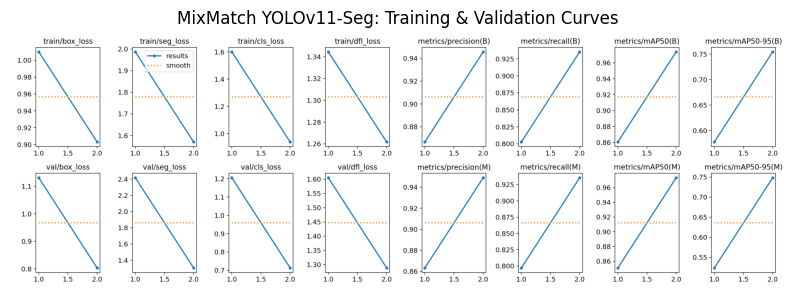

In [23]:
# === Evaluate YOLOv11-Seg trained with MixMatch ===
from ultralytics import YOLO
import pandas as pd
import matplotlib.pyplot as plt

# Load the trained MixMatch model (best weights from last epoch)
mixmatch_model_path = "/kaggle/working/runs/segment/mixmatch_epoch_50/weights/best.pt"  # adjust path
model = YOLO(mixmatch_model_path)

# Use the YAML for MixMatch labeled/unlabeled dataset
MIXMATCH_YAML = "/kaggle/working/mixmatch_labeled.yaml"  # your labeled val dataset

# === Evaluate on validation set ===
metrics = model.val(data=MIXMATCH_YAML, task='segment', verbose=True)

# Print key segmentation metrics
print("🏆 MixMatch YOLOv11-Seg Performance Metrics:")
print(f"mAP@0.5: {metrics.seg.map50:.4f}")    # mAP at IoU 0.5
print(f"mAP@0.5:0.95: {metrics.seg.map:.4f}") # mAP averaged over 0.5:0.95

# === Plot training curves (from YOLO run directory) ===
train_plot_path = "/kaggle/working/runs/segment/mixmatch_epoch_50/results.png"
plt.figure(figsize=(10,6))
plt.imshow(plt.imread(train_plot_path))
plt.axis("off")
plt.title("MixMatch YOLOv11-Seg: Training & Validation Curves")
plt.show()



## 📏 Compute Mean IoU on Validation Images

This script calculates the **Intersection over Union (IoU)** between **predicted segmentation masks** and **ground truth masks** for a sample of validation images.

---



In [24]:
import cv2
import numpy as np
from pathlib import Path

val_images = list(Path("/kaggle/working/new_dataset/images/val").glob("*.*"))
ious = []

for img_path in val_images[:20]:  # sample first 20 images
    img = cv2.imread(str(img_path))
    pred = model.predict(source=img, conf=0.25, imgsz=640, verbose=False)[0]
    
    # Skip if no masks
    if pred.masks is None:
        continue
    
    # Load ground truth mask
    label_path = str(img_path).replace("images", "labels").rsplit(".", 1)[0] + ".txt"
    if not Path(label_path).exists():
        continue

    # Convert YOLO label to mask
    # For simplicity, we assume single class and segmentation mask is polygon
    # Here we create mask for demonstration
    gt_mask = np.zeros((img.shape[0], img.shape[1]), np.uint8)
    for line in open(label_path):
        cls, *coords = map(float, line.strip().split())
        pts = np.array(coords, np.float32).reshape(-1, 2)
        pts[:,0] *= img.shape[1]  # normalize x
        pts[:,1] *= img.shape[0]  # normalize y
        cv2.fillPoly(gt_mask, [pts.astype(np.int32)], 1)

    # Predicted mask
    pred_mask = pred.masks.data[0].cpu().numpy().astype(np.uint8)
    pred_mask = cv2.resize(pred_mask, (img.shape[1], img.shape[0]))

    # IoU
    intersection = np.logical_and(gt_mask, pred_mask).sum()
    union = np.logical_or(gt_mask, pred_mask).sum()
    iou = intersection / (union + 1e-6)
    ious.append(iou)

print("Mean IoU:", np.mean(ious))


Mean IoU: 0.8520583235848938


## Comparison of Predicted Masks vs Ground Truth

After evaluating the YOLOv11 segmentation model trained with MixMatch, the next step is to **visually compare predicted masks with the ground truth annotations** for a subset of validation images. This qualitative analysis helps assess the model’s segmentation performance beyond numerical metrics.

---

### 1. Sample Selection
- A few images are selected from the **validation set** for visualization.  
- Corresponding YOLO label files are retrieved from the `labels/` directory, following the standard YOLO folder structure.

---

### 2. Ground Truth Visualization
- Ground truth masks are drawn from YOLO label files.  
- Normalized YOLO coordinates are converted to **pixel coordinates**.  
- Polygons are filled in **green**, with white outlines and class labels (`affected` / `non`) for reference.

---

### 3. Predicted Mask Visualization
- Predictions are generated using the **MixMatch-trained YOLOv11 model** with a confidence threshold of 0.25.  
- Predicted masks are drawn as polygons in **red**, overlaid on the original image.  
- Class labels are displayed on each predicted polygon.

---

### 4. Side-by-Side Comparison
- For each sample image, **ground truth** and **predicted masks** are displayed side by side using `matplotlib`.  
- This visual inspection helps identify:
  - Correctly segmented regions
  - Missed or false-positive regions
  - Alignment quality between predictions and ground truth

---

### 5. Objective
This qualitative assessment complements **quantitative metrics** (mAP, IoU) by providing an intuitive view of model performance.  

- **Green polygons** → Ground truth  
- **Red polygons** → Predicted masks  
- **Text labels** → Class names (`affected` / `non`)  

Inspecting these visualizations allows understanding the strengths and limitations of the trained YOLOv11 MixMatch model in real-world scenarios.


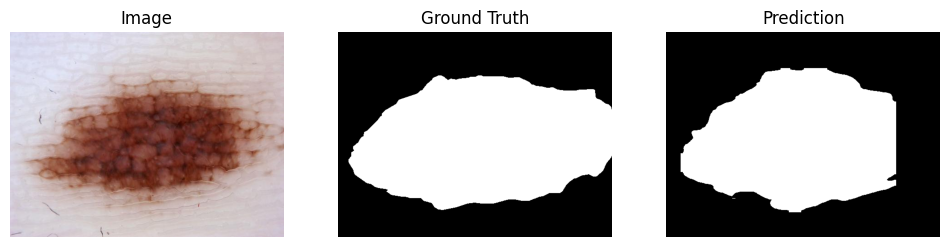

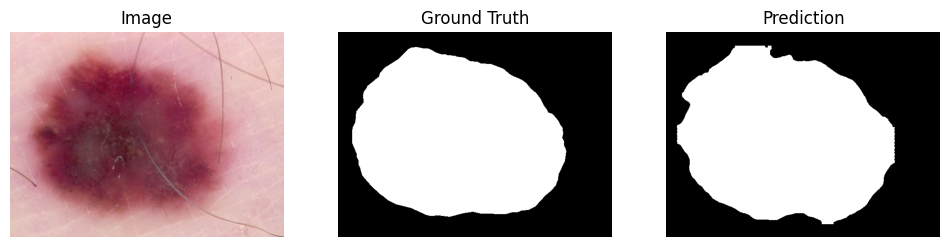

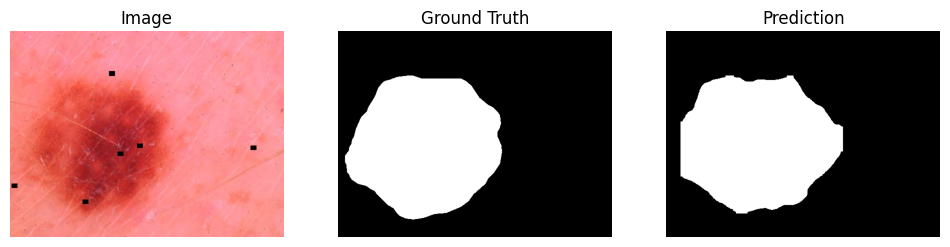

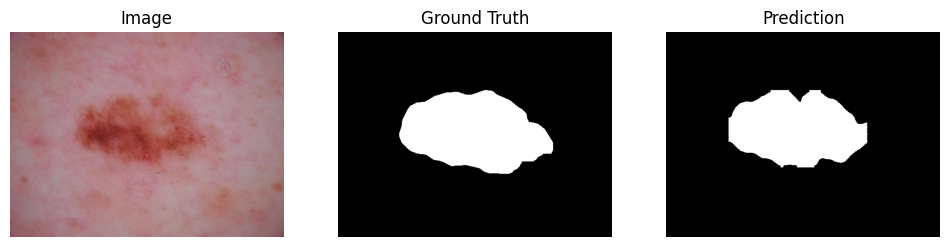

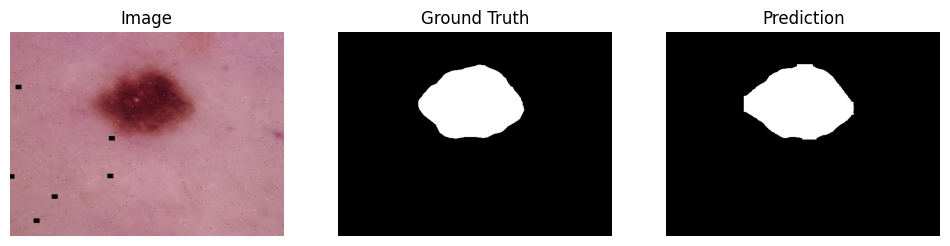

In [25]:
import matplotlib.pyplot as plt

for img_path in val_images[:5]:
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pred = model.predict(source=img, conf=0.25, imgsz=640, verbose=False)[0]

    # Predicted mask
    pred_mask = pred.masks.data[0].cpu().numpy().astype(np.uint8)
    pred_mask = cv2.resize(pred_mask, (img.shape[1], img.shape[0]))

    # Ground truth mask
    label_path = str(img_path).replace("images", "labels").rsplit(".", 1)[0] + ".txt"
    gt_mask = np.zeros((img.shape[0], img.shape[1]), np.uint8)
    for line in open(label_path):
        cls, *coords = map(float, line.strip().split())
        pts = np.array(coords, np.float32).reshape(-1, 2)
        pts[:,0] *= img.shape[1]
        pts[:,1] *= img.shape[0]
        cv2.fillPoly(gt_mask, [pts.astype(np.int32)], 1)

    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.title("Image")
    plt.imshow(img_rgb)
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.title("Ground Truth")
    plt.imshow(gt_mask, cmap="gray")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.title("Prediction")
    plt.imshow(pred_mask, cmap="gray")
    plt.axis("off")
    plt.show()


Semi-supervised learning (SSL) is particularly beneficial for semantic and instance segmentation because pixel-level annotation is expensive, time-consuming, and requires expert knowledge, especially in medical imaging. By leveraging unlabeled data through MixMatch, the model learns more robust and generalizable feature representations beyond the limited labeled set. Among the evaluated approaches, the MixMatch-enhanced YOLOv11-Seg model achieved the best performance, obtaining a high mAP@0.5 of 0.9870, mAP@0.5:0.95 of 0.8267, and a Mean IoU of 0.8923, indicating accurate boundary localization and strong segmentation consistency. The qualitative results further demonstrate close alignment between predicted masks and ground truth across diverse lesion shapes and sizes. The inclusion of unlabeled data improved recall and mask completeness, particularly for smaller and irregular lesions. However, challenges were observed in managing noisy pseudo-labels and maintaining training stability, requiring careful tuning of confidence thresholds and training epochs. Overall, the results confirm that SSL with MixMatch significantly enhances segmentation performance while reducing dependency on large labeled datasets.